# (0) Import Library + Dataset

In [1]:
## pip install altair vega_datasets

In [2]:
import numpy as np
import pandas as pd

In [3]:
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import altair as alt

In [4]:
customerData = pd.read_csv('dataset/customerData_Clean.csv')
customerData.drop(columns = "Unnamed: 0", inplace = True)
customerData

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,MntGroceryProducts,TotalPurchase,AcceptedCmp,YearRange,TotalChild,HaveChild
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,10,4,7,0,806,25,1,1950,0,0
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,1,2,5,0,9,6,0,1950,2,1
2,1965,Graduation,Married,71613.0,0,0,21-08-2013,26,426,49,...,2,10,4,0,287,21,0,1960,0,0
3,1984,Graduation,Married,26646.0,1,0,10-02-2014,26,11,4,...,0,4,6,0,34,8,0,1980,1,1
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,...,3,6,5,0,207,19,0,1980,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2183,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,...,3,4,5,0,267,18,0,1960,1,1
2184,1946,PhD,Married,64014.0,2,1,10-06-2014,56,406,0,...,2,5,7,0,30,22,1,1940,3,1
2185,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,...,3,13,6,0,297,19,1,1980,0,0
2186,1956,Master,Married,69245.0,0,1,24-01-2014,8,428,30,...,5,10,3,0,324,23,0,1950,1,1


In [5]:
colOfNum = []
colOfCat = []
for col in customerData:
    if str(customerData[col].dtypes) != "int64" and str(customerData[col].dtypes) != "float64":
        colOfCat.append(str(col))
    else:
        colOfNum.append(str(col))
        
colOfCat.extend(['Kidhome','Teenhome','YearRange','HaveChild'])

for element in ['Kidhome','Teenhome','YearRange','HaveChild']:
    colOfNum.remove(element)
    
print("Column which consider as Numerical Data:\n", colOfNum)
print()
print("Column which consider as Categorical Data:\n",colOfCat)

Column which consider as Numerical Data:
 ['Year_Birth', 'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'MntGroceryProducts', 'TotalPurchase', 'AcceptedCmp', 'TotalChild']

Column which consider as Categorical Data:
 ['Education', 'Marital_Status', 'Dt_Customer', 'Kidhome', 'Teenhome', 'YearRange', 'HaveChild']


In [6]:
for data in colOfCat:
    customerData[data] = customerData[data].astype("category")

In [7]:
customerData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2188 entries, 0 to 2187
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Year_Birth           2188 non-null   int64   
 1   Education            2188 non-null   category
 2   Marital_Status       2188 non-null   category
 3   Income               2188 non-null   float64 
 4   Kidhome              2188 non-null   category
 5   Teenhome             2188 non-null   category
 6   Dt_Customer          2188 non-null   category
 7   Recency              2188 non-null   int64   
 8   MntWines             2188 non-null   int64   
 9   MntFruits            2188 non-null   int64   
 10  MntMeatProducts      2188 non-null   int64   
 11  MntFishProducts      2188 non-null   int64   
 12  MntSweetProducts     2188 non-null   int64   
 13  MntGoldProds         2188 non-null   int64   
 14  NumDealsPurchases    2188 non-null   int64   
 15  NumWebPurchases      

# (1) Overview

Below is the info of the dataset.

In [8]:
customerData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2188 entries, 0 to 2187
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Year_Birth           2188 non-null   int64   
 1   Education            2188 non-null   category
 2   Marital_Status       2188 non-null   category
 3   Income               2188 non-null   float64 
 4   Kidhome              2188 non-null   category
 5   Teenhome             2188 non-null   category
 6   Dt_Customer          2188 non-null   category
 7   Recency              2188 non-null   int64   
 8   MntWines             2188 non-null   int64   
 9   MntFruits            2188 non-null   int64   
 10  MntMeatProducts      2188 non-null   int64   
 11  MntFishProducts      2188 non-null   int64   
 12  MntSweetProducts     2188 non-null   int64   
 13  MntGoldProds         2188 non-null   int64   
 14  NumDealsPurchases    2188 non-null   int64   
 15  NumWebPurchases      

## (2) Overview

In [9]:
customerData[colOfNum].describe()

,Year_Birth,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,MntGroceryProducts,TotalPurchase,AcceptedCmp,TotalChild
count,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000,2188.000000
mean,1968.852834,51483.184644,49.266910,303.828154,26.203839,162.244059,37.091865,26.717093,43.407221,2.319927,4.068099,2.606947,5.825411,5.322212,0.009141,225.539762,14.820384,0.435558,0.960695
std,11.686082,20025.920179,28.911119,335.984981,39.543642,212.817373,54.018983,40.393276,50.460178,1.816710,2.618988,2.724004,3.211299,2.252859,0.095191,275.782652,7.571045,0.871201,0.750741
min,1940.000000,7500.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,1.000000,4.000000,0.000000,0.000000
25%,1959.000000,35616.750000,24.000000,24.000000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,4.000000,0.000000,25.000000,8.000000,0.000000,0.000000
50%,1970.000000,51222.500000,50.000000,175.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,90.000000,15.000000,0.000000,1.000000
75%,1977.000000,67546.000000,74.000000,505.000000,33.000000,226.000000,49.250000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,347.250000,21.000000,1.000000,1.000000
max,1996.000000,94384.000000,99.000000,1493.000000,199.000000,984.000000,259.000000,198.000000,249.000000,15.000000,11.000000,11.000000,13.000000,9.000000,1.000000,1306.000000,39.000000,5.000000,3.000000


# (3) Response

In [303]:
response = ["MntWines","MntGoldProds","MntGroceryProducts","TotalPurchase"]

In [304]:
customerData[response].describe()

,MntWines,MntGoldProds,MntGroceryProducts,TotalPurchase
count,2188.000000,2188.000000,2188.000000,2188.000000
mean,303.828154,43.407221,225.539762,14.820384
std,335.984981,50.460178,275.782652,7.571045
min,0.000000,0.000000,1.000000,4.000000
25%,24.000000,9.000000,25.000000,8.000000
50%,175.500000,24.000000,90.000000,15.000000
75%,505.000000,56.000000,347.250000,21.000000
max,1493.000000,249.000000,1306.000000,39.000000


In [18]:
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

fig0 = ff.create_distplot([customerData['MntWines'].values], ['MntWines'],bin_size = 200)
fig1 = ff.create_distplot([customerData['MntGoldProds'].values], ['MntGoldProds'],bin_size = 50)
fig2 = ff.create_distplot([customerData['MntGroceryProducts'].values], ['MntGroceryProducts'],bin_size = 200)
fig3 = ff.create_distplot([customerData['TotalPurchase'].values], ['TotalPurchase'],bin_size = 5)

fig = make_subplots(rows=5, cols=2,
                    subplot_titles=("MntWines","MntGoldProds","", "","","",
                                                   "MntGroceryProducts","TotalPurchase","",""),
                   row_heights=[0.09,0.4,0.02,0.09,0.4],
                   vertical_spacing=0.02)

box0 = go.Box(x = customerData["MntWines"],legendgroup = "MntWines",showlegend = False,name = "")
box1 = go.Box(x = customerData["MntGoldProds"],legendgroup = "MntGoldProds",showlegend = False,name = "")
box2 = go.Box(x = customerData["MntGroceryProducts"],legendgroup = "MntGroceryProducts",showlegend = False,name = "")
box3 = go.Box(x = customerData["TotalPurchase"],legendgroup = "TotalPurchase",showlegend = False,name = "")
trace0 = go.Histogram(fig0['data'][0],legendgroup = "MntWines",marker_color='DarkOrchid')
trace1 = go.Histogram(fig1['data'][0],legendgroup = "MntGoldProds",marker_color='DarkOrange')
trace2 = go.Histogram(fig2['data'][0],legendgroup = "MntGroceryProducts",marker_color='LawnGreen')
trace3 = go.Histogram(fig3['data'][0],legendgroup = "TotalPurchase",marker_color='MediumSlateBlue')
line0 = go.Scatter(fig0['data'][1],legendgroup = "MntWines",line=dict(color='RebeccaPurple',width=1))
line1 = go.Scatter(fig1['data'][1],legendgroup = "MntGoldProds",line=dict(color='OrangeRed',width=1))
line2 = go.Scatter(fig2['data'][1],legendgroup = "MntGroceryProducts",line=dict(color='MediumSeaGreen',width=1))
line3 = go.Scatter(fig3['data'][1],legendgroup = "TotalPurchase",line=dict(color='RebeccaPurple',width=1))


fig.append_trace(box0, 1, 1)
fig.append_trace(box1, 1, 2)
fig.append_trace(box2, 4, 1)
fig.append_trace(box3, 4, 2)

fig.append_trace(trace0, 2, 1)
fig.append_trace(trace1, 2, 2)
fig.append_trace(trace2, 5, 1)
fig.append_trace(trace3, 5, 2)

fig.append_trace(line0, 2, 1)
fig.append_trace(line1, 2, 2)
fig.append_trace(line2, 5, 1)
fig.append_trace(line3, 5, 2)


fig.update_layout(height=1300)
fig.show()

# (4) Multi-Variable Visualization

In [19]:
customerData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2188 entries, 0 to 2187
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Year_Birth           2188 non-null   int64   
 1   Education            2188 non-null   category
 2   Marital_Status       2188 non-null   category
 3   Income               2188 non-null   float64 
 4   Kidhome              2188 non-null   category
 5   Teenhome             2188 non-null   category
 6   Dt_Customer          2188 non-null   category
 7   Recency              2188 non-null   int64   
 8   MntWines             2188 non-null   int64   
 9   MntFruits            2188 non-null   int64   
 10  MntMeatProducts      2188 non-null   int64   
 11  MntFishProducts      2188 non-null   int64   
 12  MntSweetProducts     2188 non-null   int64   
 13  MntGoldProds         2188 non-null   int64   
 14  NumDealsPurchases    2188 non-null   int64   
 15  NumWebPurchases      

## Visualization function for numerical data:

In [295]:
def numPredictorDetails(dataset,x,size):
    fig0 = ff.create_distplot([dataset[x].values], [x],bin_size = size)

    fig = make_subplots(rows=2, cols=1,
                        subplot_titles=(x,""),
                       row_heights=[0.2,0.8],
                       vertical_spacing=0.02)

    box0 = go.Box(x = dataset[x],legendgroup = x,showlegend = False,name = "")
    trace0 = go.Histogram(fig0['data'][0],legendgroup = x,marker_color='DarkOrchid')
    line0 = go.Scatter(fig0['data'][1],legendgroup = x,line=dict(color='RebeccaPurple',width=1))

    fig.append_trace(box0, 1, 1)
    fig.append_trace(trace0, 2, 1)
    fig.append_trace(line0, 2, 1)

    fig.update_layout(height=500)
    fig.show()

In [290]:
def scatterResponse(dataset,x):
    fig = make_subplots(rows=5, cols=4,
                        subplot_titles=("MntWines","","MntGoldProds","",
                                        "","","","",
                                        "","","","",
                                        "MntGroceryProducts","","TotalPurchase","",
                                        "","","",""), 
                        row_heights=[0.05,0.415,0.02,0.05,0.415],
                        column_widths=[0.45,0.05,0.45,0.05],
                       vertical_spacing=0.02)

    boxX0 = go.Box(x = dataset[x],legendgroup = "MntWines",showlegend = False,name = "")
    boxX1 = go.Box(x = dataset[x],legendgroup = "MntGoldProds",showlegend = False,name = "")
    boxX2 = go.Box(x = dataset[x],legendgroup = "MntGroceryProducts",showlegend = False,name = "")
    boxX3 = go.Box(x = dataset[x],legendgroup = "TotalPurchase",showlegend = False,name = "")

    boxY0 = go.Box(y = dataset["MntWines"],legendgroup = "MntWines",showlegend = False,name = "",
                  fillcolor='Orchid',line=dict(color='RebeccaPurple'))
    boxY1 = go.Box(y = dataset["MntGoldProds"],legendgroup = "MntGoldProds",showlegend = False,name = "",
                  fillcolor='LightPink',line=dict(color='OrangeRed'))
    boxY2 = go.Box(y = dataset["MntGroceryProducts"],legendgroup = "MntGroceryProducts",showlegend = False,name = "",
                  fillcolor='PaleGreen',line=dict(color='MediumSeaGreen'))
    boxY3 = go.Box(y = dataset["TotalPurchase"],legendgroup = "TotalPurchase",showlegend = False,name = "",
                  fillcolor='Thistle',line=dict(color='RebeccaPurple'))

    line0 = go.Scatter(x = dataset[x], y = dataset["MntWines"], mode = "markers", marker = {'color' : 'DarkOrchid'},
                       showlegend = True,legendgroup = "MntWines",name = "MntWines")
    line1 = go.Scatter(x = dataset[x], y = dataset["MntGoldProds"],mode = "markers", marker = {'color' : 'DarkOrange'},
                       showlegend = True,legendgroup = "MntGoldProds",name = "MntGoldProds")
    line2 = go.Scatter(x = dataset[x], y = dataset["MntGroceryProducts"], mode = "markers",marker = {'color' : 'LawnGreen'},
                       showlegend = True,legendgroup = "MntGroceryProducts",name = "MntGroceryProducts")
    line3 = go.Scatter(x = dataset[x], y = dataset["TotalPurchase"], mode = "markers",marker = {'color' : 'MediumSlateBlue'},
                       showlegend = True,legendgroup = "TotalPurchase",name = "TotalPurchase")

    fig.append_trace(boxX0, 1, 1)
    fig.append_trace(boxX1, 1, 3)
    fig.append_trace(boxX2, 4, 1)
    fig.append_trace(boxX3, 4, 3)

    fig.append_trace(boxY0, 2, 2)
    fig.append_trace(boxY1, 2, 4)
    fig.append_trace(boxY2, 5, 2)
    fig.append_trace(boxY3, 5, 4)

    fig.append_trace(line0, 2, 1)
    fig.append_trace(line1, 2, 3)
    fig.append_trace(line2, 5, 1)
    fig.append_trace(line3, 5, 3)

    fig.update_layout(height=1300)
    fig.show()

## Visualization function for categorical data:

In [ ]:
response = ["MntWines","MntGoldProds","MntGroceryProducts","TotalPurchase"]

In [ ]:
def boxPlotXY(dataset,x,y,axes = [],axX = 0,axY = 0):
    grouped = dataset.loc[:,[x, y]].groupby([x]).median().sort_values(by=y)
    if(len(axes) == 0):
        sb.boxplot(x = dataset[x],y = dataset[y],order=grouped.index,orient = "v")
    else:
        sb.boxplot(x = dataset[x],y = dataset[y],order=grouped.index,orient = "v",ax = axes[axX,axY])

def boxPlotResponse(dataset,x,Y_Array,x_count,y_count):
    if(x_count + y_count != len(Y_Array)):
        raise IndexError("Graph count does not match with the number of response.")
    
    f, axes = plt.subplots(x_count, y_count, figsize=(20, 12))
    
    i = 0
    j = 0
    for var in Y_Array:
        boxPlotXY(customerData,x,var,axes,i,j)
        j+=1
        if(j == x_count):
            j=0
            i+=1

In [298]:
def histogramCountOld(dataset,x):
    #Cite M2 ExploratoryAnalysis

    # Generations in the Dataset
    print("Number of", x ,":", len(dataset[x].unique()))

    # Pokemons in each Generation
    print(dataset[x].value_counts())
    sb.catplot(y = x, data = dataset, kind = "count")

In [352]:
def histogramCount(dataset,x,catArray = [],meta = {}):
    if len(catArray) != 0:
        fig = px.histogram(dataset, y = x,text_auto = True, category_orders={x: catArray})
    else:
        fig = px.histogram(dataset, y = x,text_auto = True)
        
    if len(meta) != 0:
        fig.update_layout(height= meta["Height"],width = meta["Width"])
    else:
        fig.update_layout(height=70 * (len(dataset[x].unique())+1),width = 500)
    
    
    fig.show()

In [353]:
def catVarResponse(dataset,x,Y_Array,x_count,y_count,catArray = [],meta = {}):
    histogramCount(dataset,x,catArray,meta)
    boxPlotResponse(dataset,x,Y_Array,x_count,y_count)

### Education

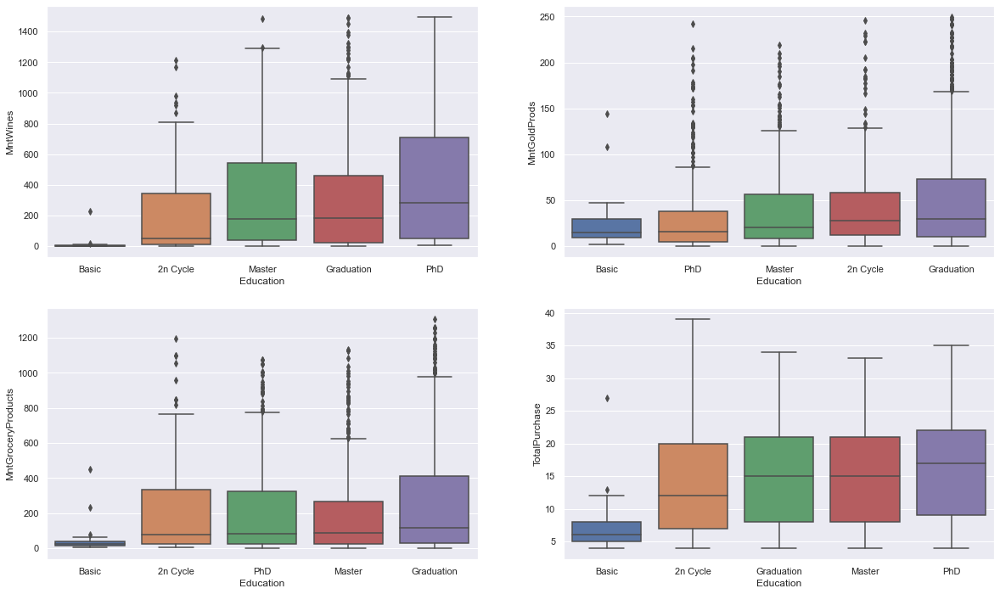

In [305]:
catVarResponse(customerData,"Education",response,2,2)

### Marital_Status

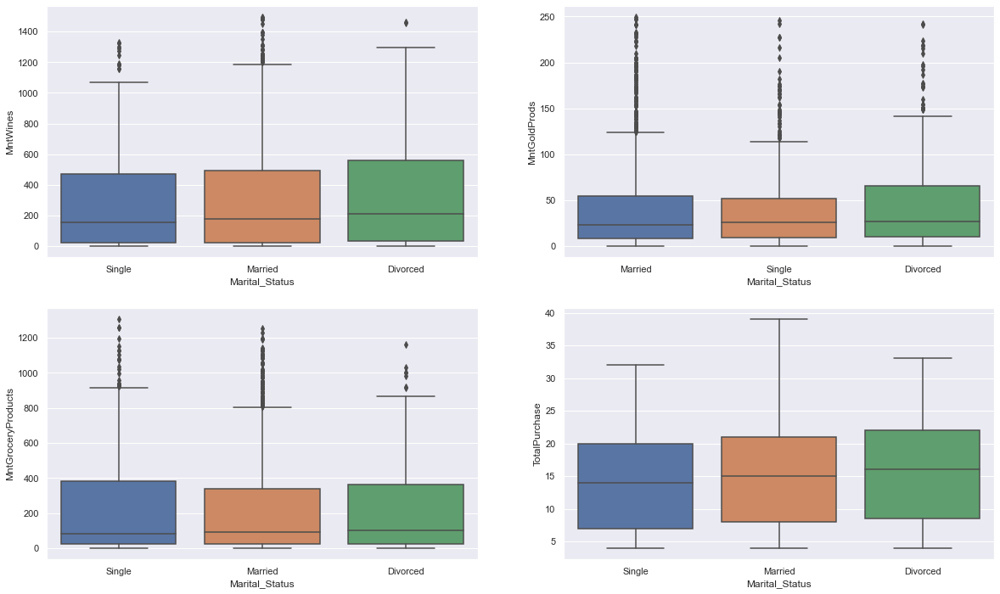

In [354]:
catVarResponse(customerData,"Marital_Status",response,2,2,["Single","Married","Divorced"])

### Income

In [296]:
numPredictorDetails(customerData,"Income",5000)

In [60]:
scatterResponse(customerData,"Income")

### TotalChild

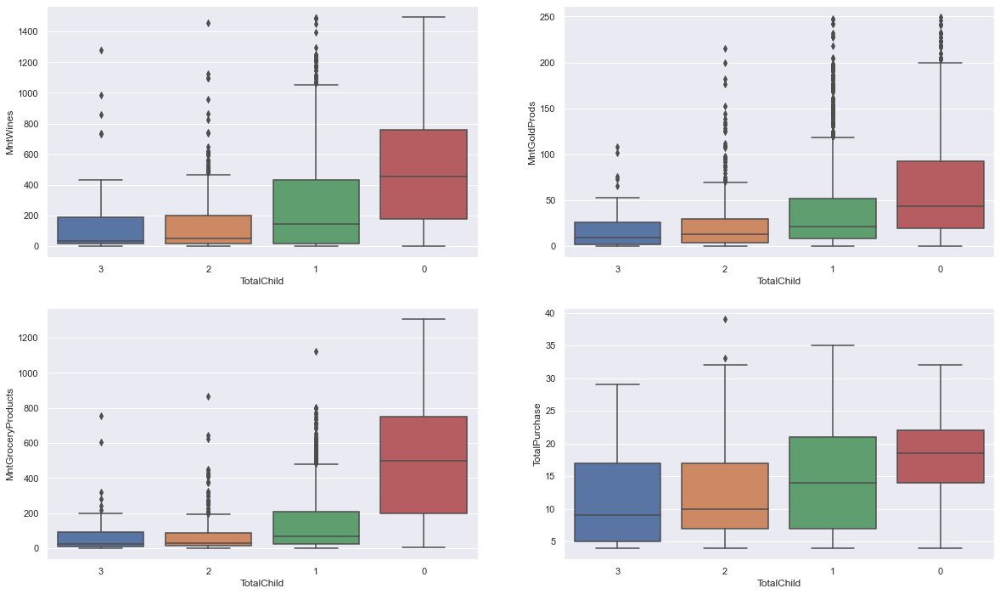

In [314]:
catVarResponse(customerData,"TotalChild",response,2,2)

In [315]:
scatterResponse(customerData,"TotalChild")

### HaveChild

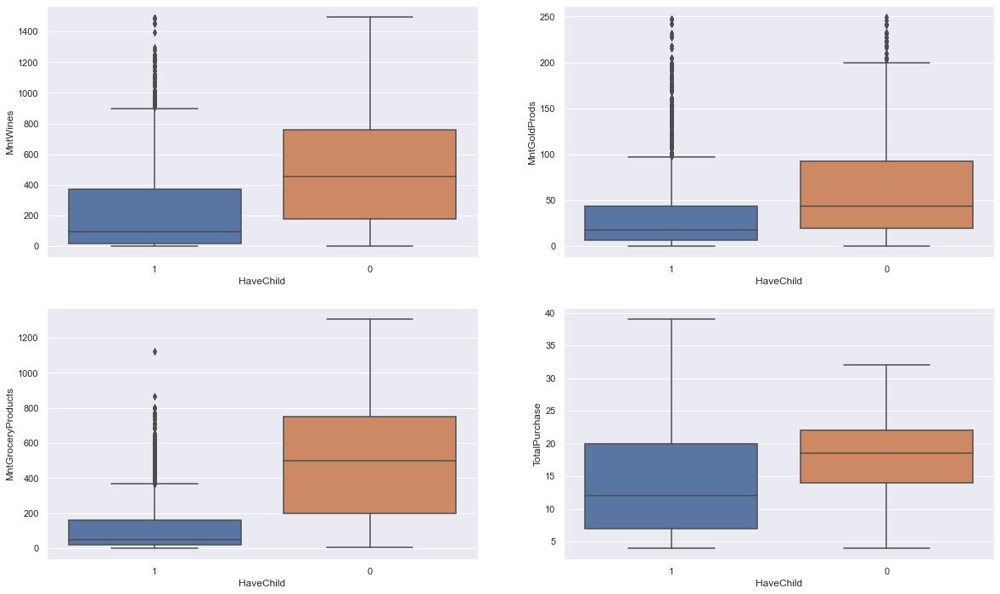

In [317]:
catVarResponse(customerData,"HaveChild",response,2,2)

### NumWebVisitsMonth

In [297]:
numPredictorDetails(customerData,"NumWebVisitsMonth",1)

In [301]:
scatterResponse(customerData,"NumWebVisitsMonth")

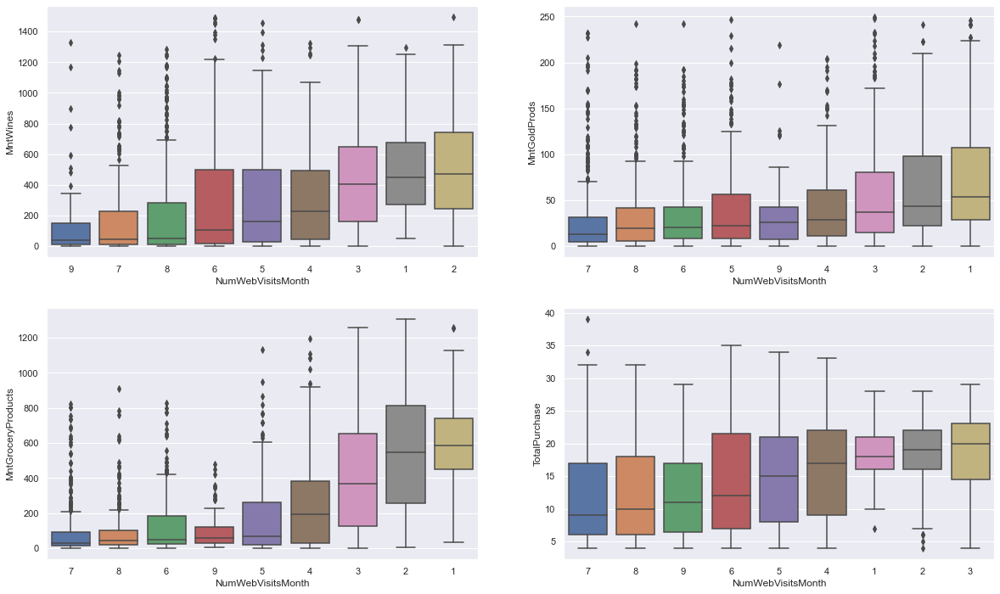

In [302]:
catVarResponse(customerData,"NumWebVisitsMonth",response,2,2)

### Complain

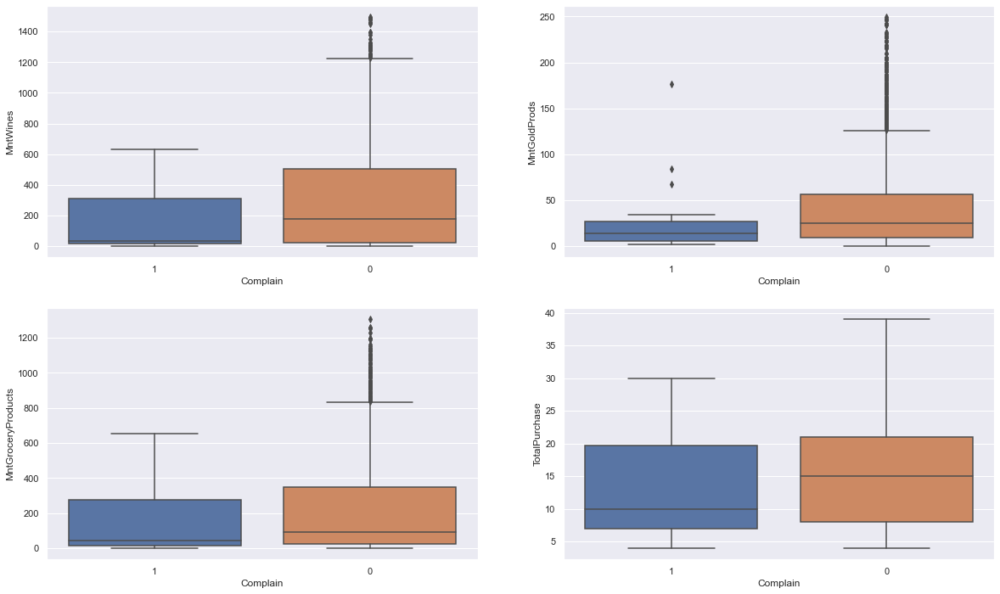

In [319]:
catVarResponse(customerData,"Complain",response,2,2)

### AcceptedCmp

In [321]:
numPredictorDetails(customerData,"AcceptedCmp",1)

In [322]:
scatterResponse(customerData,"AcceptedCmp")

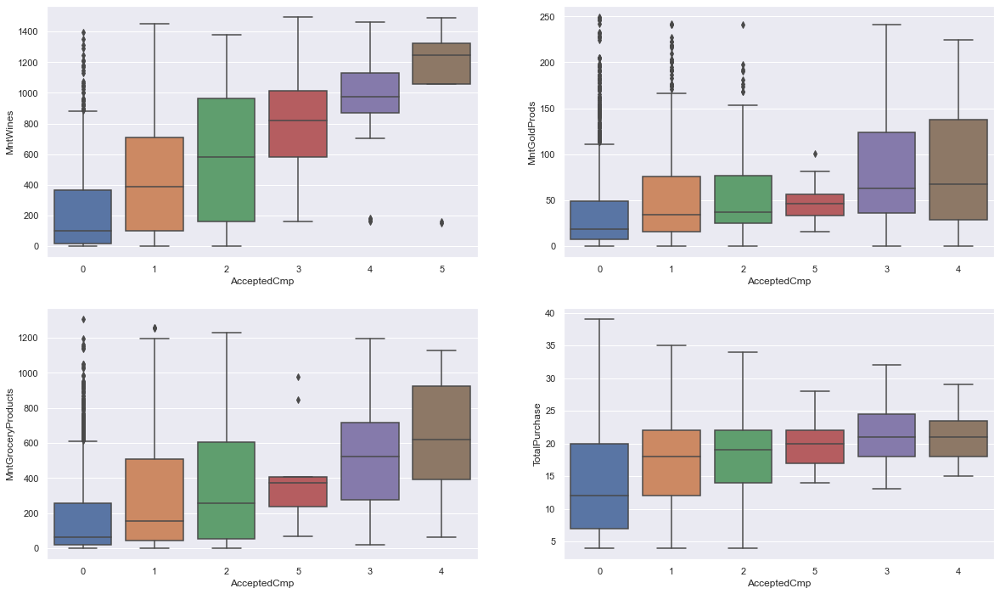

In [320]:
catVarResponse(customerData,"AcceptedCmp",response,2,2)

### YearRange

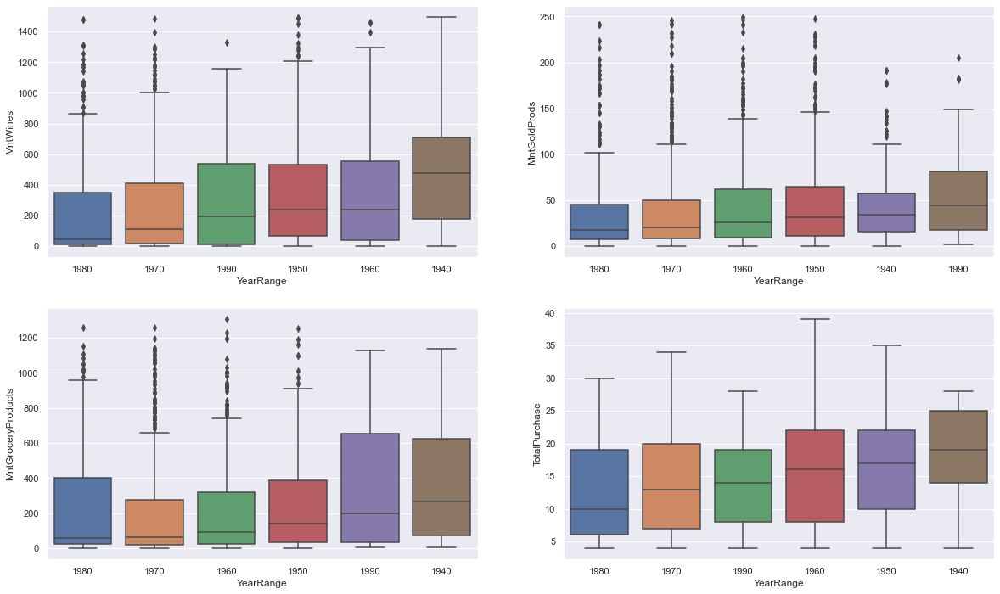

In [323]:
catVarResponse(customerData,"YearRange",response,2,2)

### Recency

In [349]:
numPredictorDetails(customerData,"Recency",10)

In [350]:
scatterResponse(customerData,"Recency")

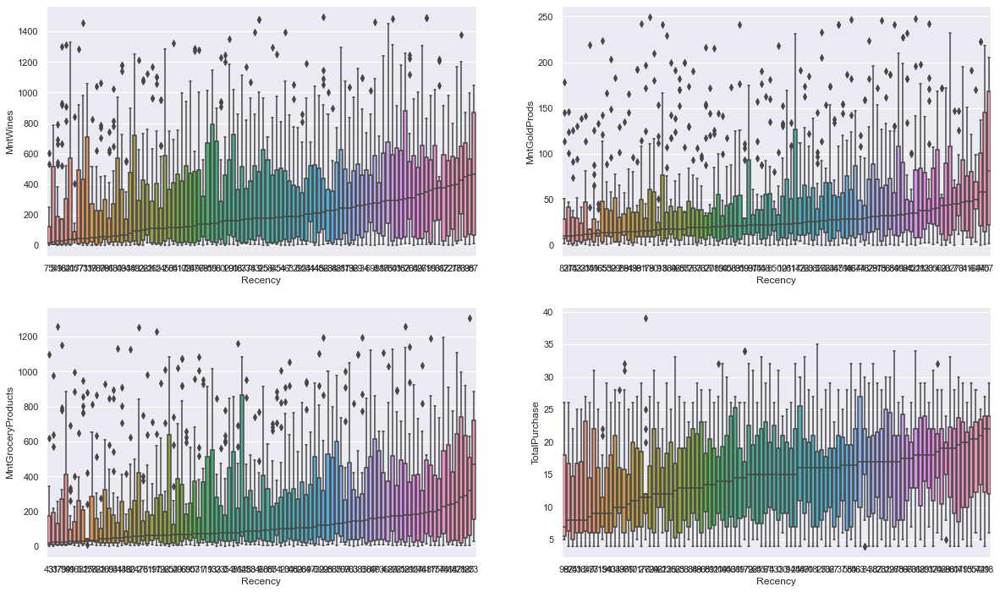

In [356]:
catVarResponse(customerData,"Recency",response,2,2,meta = {"Height" : 800,"Width" : 500})

# (5) Exploration

## Exploration - heatmap

In [346]:
response = ["MntWines","MntGoldProds","MntGroceryProducts","TotalPurchase"]
interestingVar = ["Income","Recency","TotalChild","NumWebVisitsMonth","AcceptedCmp"]
interestingVar.extend(response)
print(interestingVar)

['Income', 'Recency', 'TotalChild', 'NumWebVisitsMonth', 'AcceptedCmp', 'MntWines', 'MntGoldProds', 'MntGroceryProducts', 'TotalPurchase']


<AxesSubplot:>

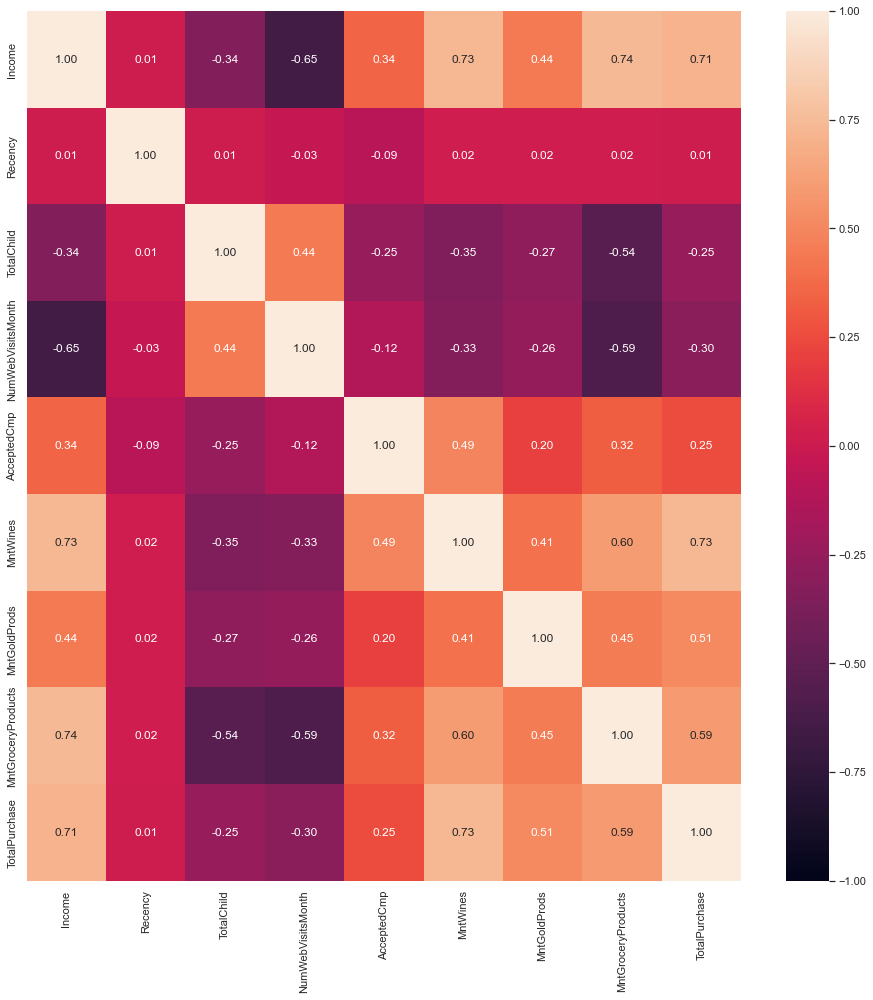

In [347]:
f = plt.figure(figsize=(16,16))
sb.heatmap(customerData[interestingVar].corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

## Exploration - Multi-variable scatterplot using altair

In [324]:
def interactiveScatterPlot(dataset,x,y,var):
    alt.renderers.enable('default')
    selection = alt.selection_multi(fields=[var], bind='legend')
    chart = alt.Chart(dataset).mark_circle(size=50).encode(
        alt.X(x),
        alt.Y(y),
        alt.Color(var, 
                  legend=alt.Legend(
                      title=var,  
                      orient='left',
                      titleFontSize=15,
                      labelFontSize=13)
                 ),
        opacity=alt.condition(selection, alt.value(1), alt.value(0))
    ).properties(
        height=350, width=500
    ).configure_axis(
        titleFontSize=20,
        labelFontSize=15
    ).add_selection(
        selection
    )
    
    return chart

In [326]:
interactiveScatterPlot(customerData,'Income','TotalPurchase','Education')

alt.Chart(...)

In [327]:
interactiveScatterPlot(customerData,'Income','MntGroceryProducts','Education')

alt.Chart(...)

In [328]:
interactiveScatterPlot(customerData,'Income','MntWines','Education')

alt.Chart(...)

In [329]:
interactiveScatterPlot(customerData,'Income','MntGoldProds','Education')

alt.Chart(...)

Based on the above graph, we can notice how people with basic education earn less income than other.

In [330]:
customerDataInter = customerData.copy()

In [331]:
customerDataInter["AcceptedCmp"] = customerDataInter["AcceptedCmp"].astype("category")

In [332]:
customerDataInter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2188 entries, 0 to 2187
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Year_Birth           2188 non-null   int64   
 1   Education            2188 non-null   category
 2   Marital_Status       2188 non-null   category
 3   Income               2188 non-null   float64 
 4   Kidhome              2188 non-null   category
 5   Teenhome             2188 non-null   category
 6   Dt_Customer          2188 non-null   category
 7   Recency              2188 non-null   int64   
 8   MntWines             2188 non-null   int64   
 9   MntFruits            2188 non-null   int64   
 10  MntMeatProducts      2188 non-null   int64   
 11  MntFishProducts      2188 non-null   int64   
 12  MntSweetProducts     2188 non-null   int64   
 13  MntGoldProds         2188 non-null   int64   
 14  NumDealsPurchases    2188 non-null   int64   
 15  NumWebPurchases      

In [333]:
interactiveScatterPlot(customerDataInter,'Income','TotalPurchase','AcceptedCmp')

alt.Chart(...)

Based on the above graph, we can notice how people take part in more campaign are those who earn more money and buy more things.

In [357]:
interactiveScatterPlot(customerDataInter,'Income','MntWines','AcceptedCmp')

alt.Chart(...)

In [358]:
interactiveScatterPlot(customerDataInter,'Income','MntGoldProds','AcceptedCmp')

alt.Chart(...)

In [359]:
interactiveScatterPlot(customerDataInter,'Income','MntGroceryProducts','AcceptedCmp')

alt.Chart(...)

Based on the above graph, we can notice how people take part in more campaign seems not to play important role on how many products are sold

# (5) Not-so-useful exploration